In [87]:
# setup
import cv2
import os
import numpy as np
import sys
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline
from tqdm import tqdm

plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams.update({'font.size': 12})

import tensorflow as tf
sns.set()

from glob import glob

In [88]:
# load the image directories
train_dir = r'.\imgs\train' # image folder

In [89]:
# get the list of jpegs from sub image class folders
c0_imgs = [fn for fn in os.listdir(f'{train_dir}/c0') if fn.endswith('.jpg')]
c1_imgs = [fn for fn in os.listdir(f'{train_dir}/c1') if fn.endswith('.jpg')]
c2_imgs = [fn for fn in os.listdir(f'{train_dir}/c2') if fn.endswith('.jpg')]
c3_imgs = [fn for fn in os.listdir(f'{train_dir}/c3') if fn.endswith('.jpg')]
c4_imgs = [fn for fn in os.listdir(f'{train_dir}/c4') if fn.endswith('.jpg')]
c5_imgs = [fn for fn in os.listdir(f'{train_dir}/c5') if fn.endswith('.jpg')]
c6_imgs = [fn for fn in os.listdir(f'{train_dir}/c6') if fn.endswith('.jpg')]
c7_imgs = [fn for fn in os.listdir(f'{train_dir}/c7') if fn.endswith('.jpg')]
c8_imgs = [fn for fn in os.listdir(f'{train_dir}/c8') if fn.endswith('.jpg')]
c9_imgs = [fn for fn in os.listdir(f'{train_dir}/c9') if fn.endswith('.jpg')]

## Understanding the data


In [90]:
img_list = pd.read_csv('./driver_imgs_list.csv')

<Figure size 720x576 with 0 Axes>

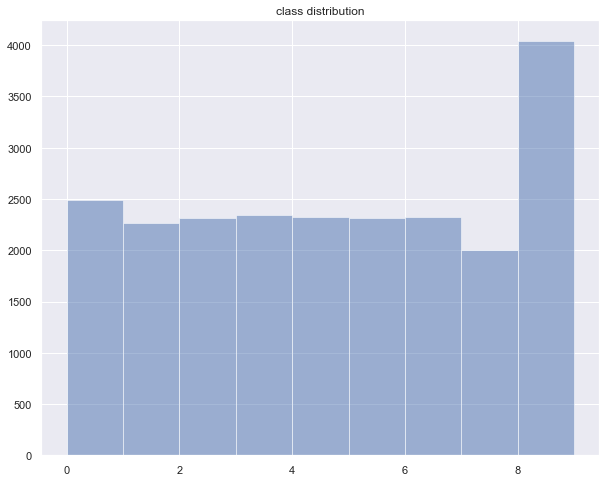

In [91]:
img_list['class_type'] = img_list['classname'].str.extract('(\d)',expand=False).astype(np.float)
plt.figure()
img_list.hist('class_type',alpha=0.5,layout=(1,1),bins=9)
plt.title('class distribution')
plt.draw()

Text(0.5, 1.0, 'subject_type, # unique subject 26')

<Figure size 720x576 with 0 Axes>

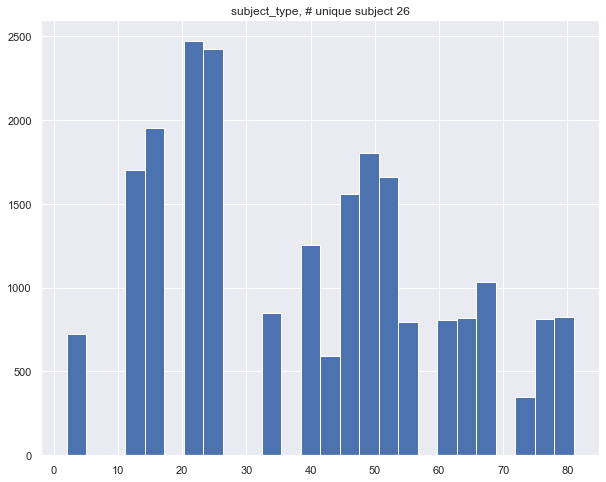

In [92]:
img_list['subject_type'] = img_list['subject'].str.extract('(\d\d\d)',expand=False).astype(np.int32)
n_unique_sub=len(img_list['subject_type'].unique())
plt.figure()
img_list.hist('subject_type',layout=(1,1),bins=n_unique_sub)
plt.title('subject_type, # unique subject {}'.format(n_unique_sub))

In [93]:
def read_image(path):
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

  0%|          | 0/10 [00:00<?, ?it/s]				# c0 : safe driving


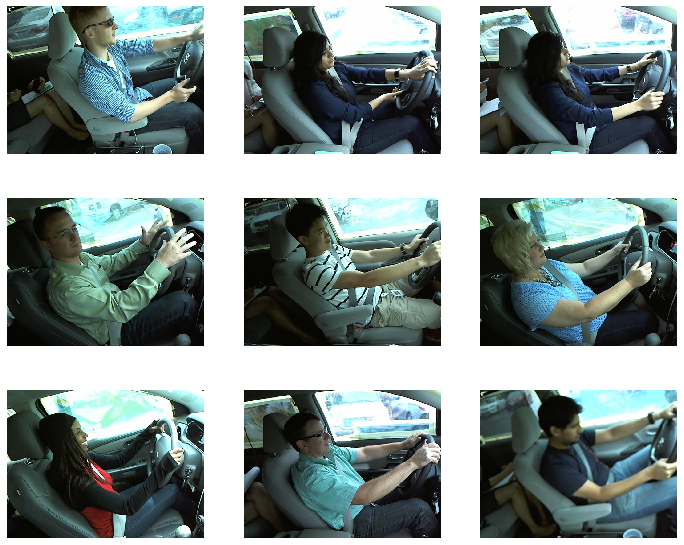

 10%|█         | 1/10 [00:01<00:13,  1.54s/it]				# c1 : texting - right


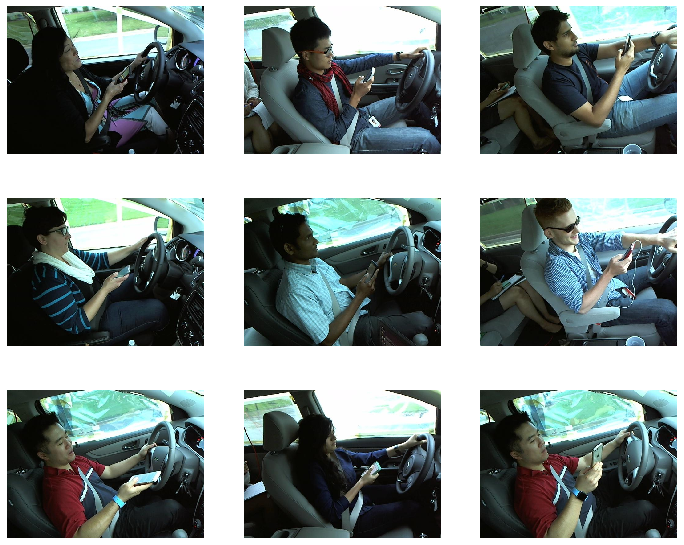

 20%|██        | 2/10 [00:03<00:12,  1.55s/it]				# c2 : talking on the phone - right


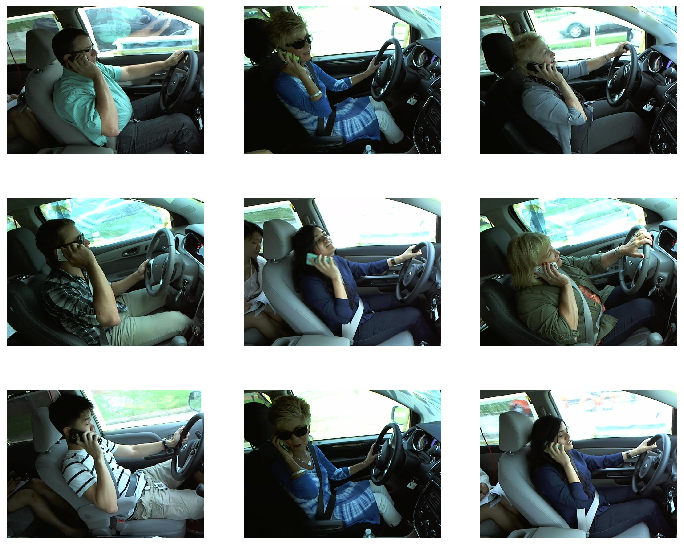

 30%|███       | 3/10 [00:04<00:11,  1.59s/it]				# c3 : texting - left


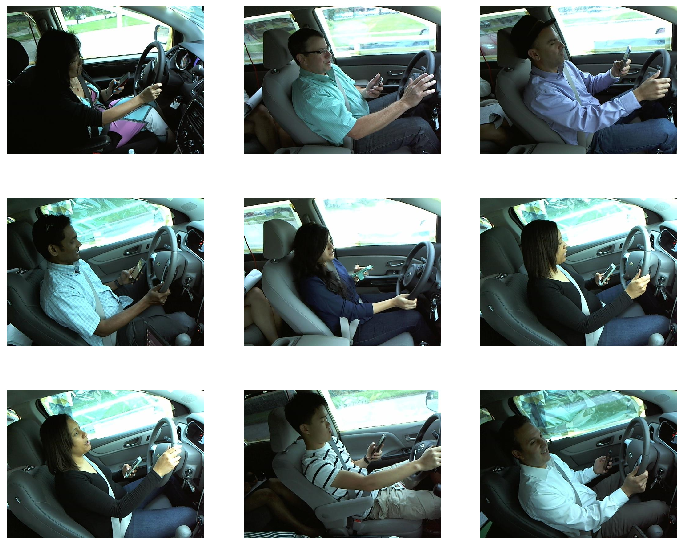

 40%|████      | 4/10 [00:06<00:10,  1.72s/it]				# c4 : talking on the phone - left


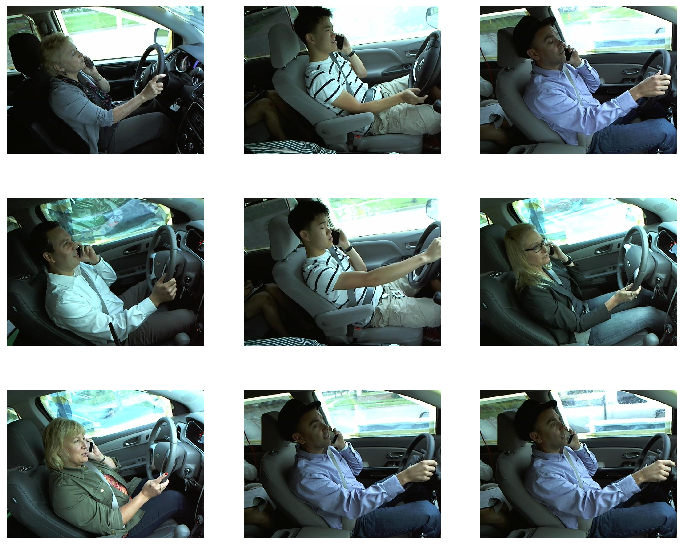

 50%|█████     | 5/10 [00:08<00:08,  1.73s/it]				# c5 : operating the radio


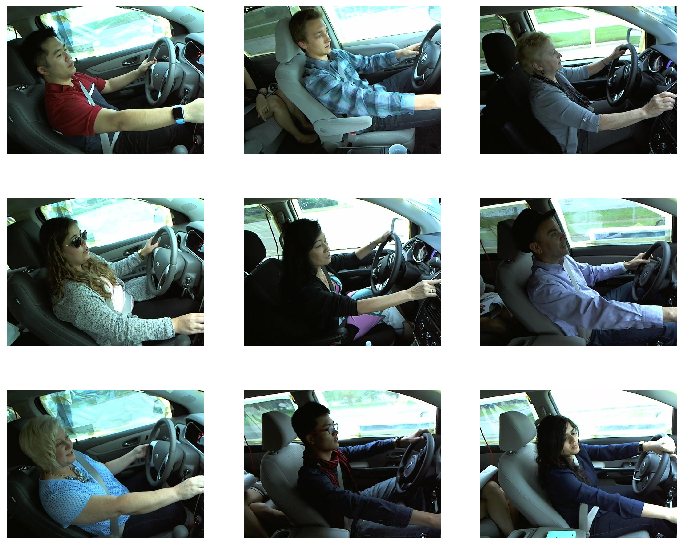

 60%|██████    | 6/10 [00:10<00:06,  1.73s/it]				# c6 : drinking


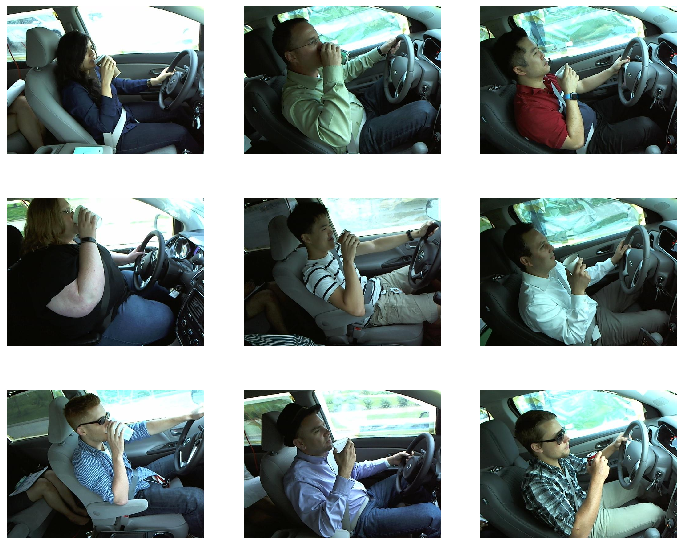

 70%|███████   | 7/10 [00:12<00:05,  1.72s/it]				# c7 : reaching behind


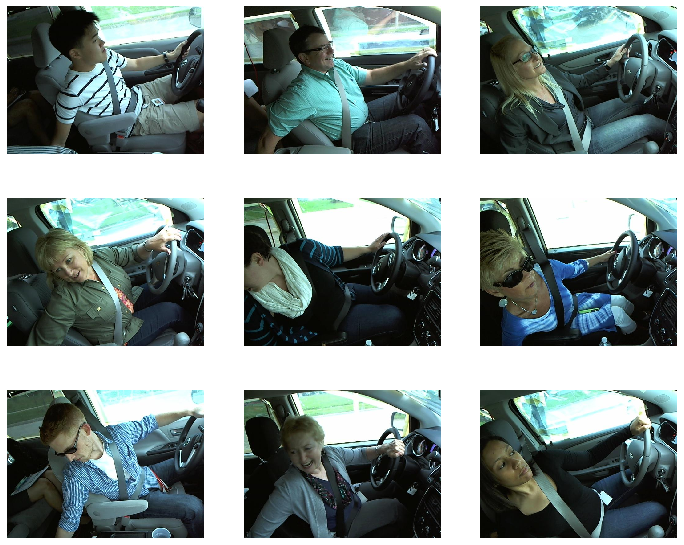

 80%|████████  | 8/10 [00:13<00:03,  1.72s/it]				# c8 : hair and makeup


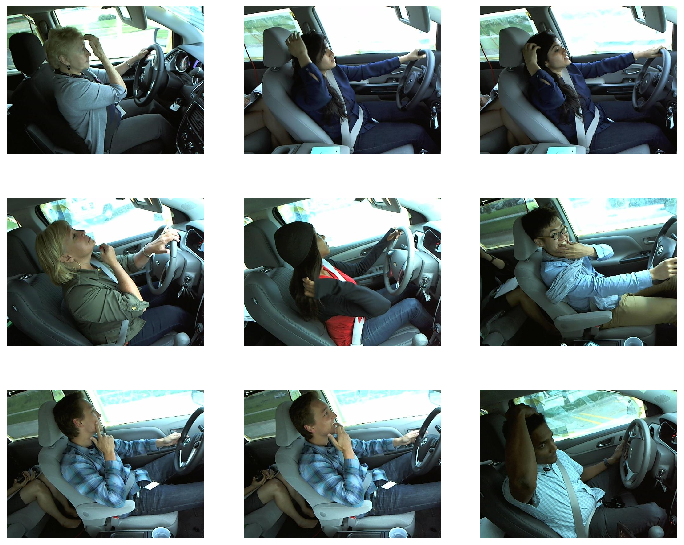

 90%|█████████ | 9/10 [00:15<00:01,  1.73s/it]				# c9 : talking to passenger


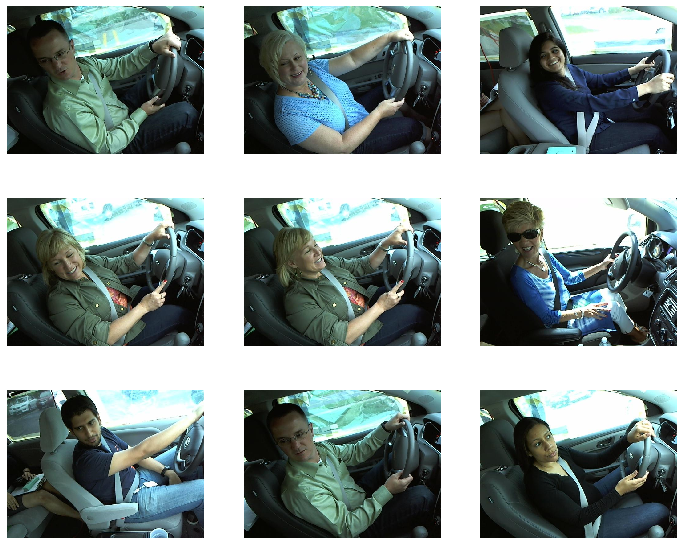

100%|██████████| 10/10 [00:17<00:00,  1.72s/it]


In [84]:

# Visualize examples by class of training data
def visualize_example_train():
    labels = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

    col_to_eng = {
        'c0': 'safe driving',
        'c1': 'texting - right',
        'c2': 'talking on the phone - right',
        'c3': 'texting - left',
        'c4': 'talking on the phone - left',
        'c5': 'operating the radio',
        'c6': 'drinking',
        'c7': 'reaching behind',
        'c8': 'hair and makeup',
        'c9': 'talking to passenger',
    }
    for label in tqdm(labels):
        f, ax = plt.subplots(figsize=(12, 10))
        files = glob('{}/train/{}/*.jpg'.format('imgs', label))
        
        for x in range(9):
            plt.subplot(3, 3, x+1)
            image = read_image(files[x])
            plt.imshow(image)
            plt.axis('off')
        print('\t\t\t\t# {} : {}'.format(label, col_to_eng[label]))
        plt.show()
        
visualize_example_train()